In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df=pd.read_csv(r'D:\Documents\Ironhack\May\Week8/BreadBasket_DMS.csv')

In [3]:
df.head()

,Date,Time,Transaction,Item
0,2016-10-30,09:58:11,1,Bread
1,2016-10-30,10:05:34,2,Scandinavian
2,2016-10-30,10:05:34,2,Scandinavian
3,2016-10-30,10:07:57,3,Hot chocolate
4,2016-10-30,10:07:57,3,Jam


Goal: Cluster different customers of the Bakery

In [5]:
df['datetime']=pd.to_datetime(df.Date+' '+df.Time)

In [9]:
df.Item.nunique()

95

In [10]:
df.Item.unique()

array(['Bread', 'Scandinavian', 'Hot chocolate', 'Jam', 'Cookies',
       'Muffin', 'Coffee', 'Pastry', 'Medialuna', 'Tea', 'NONE',
       'Tartine', 'Basket', 'Mineral water', 'Farm House', 'Fudge',
       'Juice', "Ella's Kitchen Pouches", 'Victorian Sponge', 'Frittata',
       'Hearty & Seasonal', 'Soup', 'Pick and Mix Bowls', 'Smoothies',
       'Cake', 'Mighty Protein', 'Chicken sand', 'Coke',
       'My-5 Fruit Shoot', 'Focaccia', 'Sandwich', 'Alfajores', 'Eggs',
       'Brownie', 'Dulce de Leche', 'Honey', 'The BART', 'Granola',
       'Fairy Doors', 'Empanadas', 'Keeping It Local', 'Art Tray',
       'Bowl Nic Pitt', 'Bread Pudding', 'Adjustment', 'Truffles',
       'Chimichurri Oil', 'Bacon', 'Spread', 'Kids biscuit', 'Siblings',
       'Caramel bites', 'Jammie Dodgers', 'Tiffin', 'Olum & polenta',
       'Polenta', 'The Nomad', 'Hack the stack', 'Bakewell',
       'Lemon and coconut', 'Toast', 'Scone', 'Crepes', 'Vegan mincepie',
       'Bare Popcorn', 'Muesli', 'Crisps', 'Pi

In [11]:
beverage = ['Hot chocolate', 'Coffee', 'Tea', 'Mineral water', 'Juice', 'Coke', 'Smoothies']
other = ['NONE', 'Christmas common', 'Gift voucher', "Valentine's card", 'Tshirt', 'Afternoon with the baker', 'Postcard', 'Siblings', 'Nomad bag', 'Adjustment', 'Drinking chocolate spoons ', 'Coffee granules ']
kids = ["Ella's Kitchen Pouches", 'My-5 Fruit Shoot', 'Kids biscuit']
snacks = ['Mighty Protein', 'Pick and Mix Bowls', 'Caramel bites', 'Bare Popcorn', 'Crisps', 'Cherry me Dried fruit', 'Raw bars']
bread = ['Bread', 'Toast', 'Baguette', 'Focaccia', 'Scandinavian']
breakfast_pastry = ['Muffin', 'Pastry', 'Medialuna', 'Scone']
dessert = ['Cookies', 'Tartine', 'Fudge', 'Victorian Sponge', 'Cake', 'Alfajores', 'Brownie', 'Bread Pudding', 'Bakewell', 'Raspberry shortbread sandwich', 'Lemon and coconut', 'Crepes', 'Chocolates', 'Truffles', 'Panatone']
condiments = ['Jam', 'Dulce de Leche', 'Honey', 'Gingerbread syrup', 'Extra Salami or Feta', 'Bacon', 'Spread', 'Chimichurri Oil']
breakfast = ['Eggs', 'Frittata', 'Granola', 'Muesli', 'Duck egg', 'Brioche and salami']
lunch = ['Soup', 'Sandwich', 'Chicken sand', 'Salad', 'Chicken Stew']
other_food = [x for x in df.Item.unique() if x not in beverage 
                and x not in other and x not in kids and x not in snacks 
                and x not in bread and x not in breakfast_pastry 
                and x not in dessert and x not in condiments 
                and x not in breakfast and x not in lunch]

In [14]:
df['beverage']=np.where(df.Item.isin(beverage),1,0)
df['other']=np.where(df.Item.isin(other),1,0)
df['kids']=np.where(df.Item.isin(kids),1,0)
df['snacks']=np.where(df.Item.isin(snacks),1,0)
df['bread']=np.where(df.Item.isin(bread),1,0)
df['breakfast_pastry']=np.where(df.Item.isin(breakfast_pastry),1,0)
df['breakfast']=np.where(df.Item.isin(breakfast),1,0)
df['dessert']=np.where(df.Item.isin(dessert),1,0)
df['condiments']=np.where(df.Item.isin(condiments),1,0)
df['lunch']=np.where(df.Item.isin(lunch),1,0)
df['other_food']=np.where(df.Item.isin(other_food),1,0)

In [20]:
df_group=df.groupby(['Transaction','datetime']).sum().reset_index(level='datetime').copy()

In [28]:
df_group['day_name']=df_group.datetime.dt.day_name()
df_group['hour']=df_group.datetime.dt.hour

In [29]:
df_group.head()

,datetime,beverage,other,kids,snacks,bread,breakfast_pastry,breakfast,dessert,condiments,lunch,other_food,day_name,hour
Transaction,,,,,,,,,,,,,,
1,2016-10-30 09:58:11,0,0,0,0,1,0,0,0,0,0,0,Sunday,9
2,2016-10-30 10:05:34,0,0,0,0,2,0,0,0,0,0,0,Sunday,10
3,2016-10-30 10:07:57,1,0,0,0,0,0,0,1,1,0,0,Sunday,10
4,2016-10-30 10:08:41,0,0,0,0,0,1,0,0,0,0,0,Sunday,10
5,2016-10-30 10:13:03,1,0,0,0,1,1,0,0,0,0,0,Sunday,10


In [30]:
df_group.day_name.value_counts()

Saturday     2068
Friday       1488
Sunday       1264
Thursday     1252
Tuesday      1203
Monday       1135
Wednesday    1121
Name: day_name, dtype: int64

<AxesSubplot:>

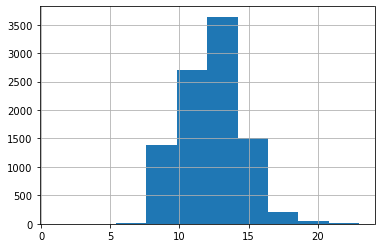

In [32]:
df_group.hour.hist()


In [33]:
df_group.drop('datetime',axis=1,inplace=True)

In [39]:
df_ml=pd.get_dummies(data=df_group, columns=['day_name'], drop_first=True).copy()

In [41]:
df_ml;

# PCA

In [42]:
from sklearn.decomposition import PCA

In [44]:
pca=PCA(0.85)
pca.fit(df_ml)
df_pca=pca.transform(df_ml)

In [46]:
df_pca=pd.DataFrame(df_pca, columns=['PC'+str(i) for i in range(1, df_pca.shape[1]+1)])

# Clustering

In [48]:
from sklearn.cluster import KMeans

In [49]:
!pip install yellowbrick

In [50]:
from yellowbrick.cluster import KElbowVisualizer

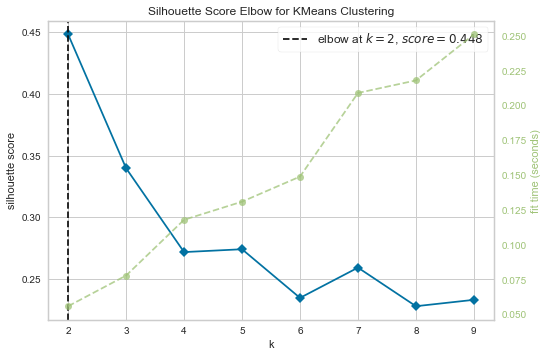

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [56]:
model=KMeans()
visualizer=KElbowVisualizer(model, k=(2,10), metric='silhouette')

visualizer.fit(df_pca)
visualizer.poof()

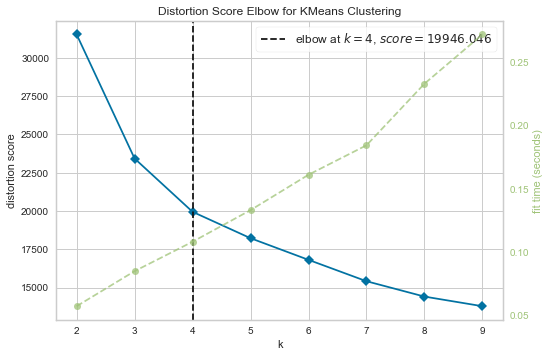

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [54]:
model=KMeans()
visualizer=KElbowVisualizer(model, k=(2,10))

visualizer.fit(df_pca)
visualizer.poof()

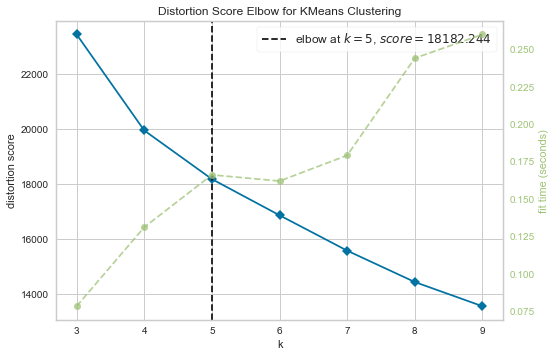

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [57]:
model=KMeans()
visualizer=KElbowVisualizer(model, k=(3,10))

visualizer.fit(df_pca)
visualizer.poof()

After running the KElbowVisualizer several times I ended up saying that I prefer 5 clusters.

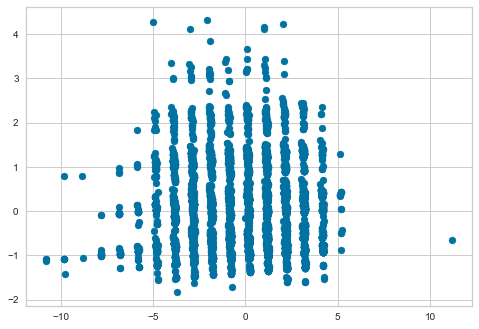

In [58]:
plt.scatter(df_pca['PC1'], df_pca['PC2'])

In [59]:
model=KMeans(5)
model.fit(df_pca)
model.predict(df_pca)

array([4, 4, 4, ..., 1, 1, 3])

In [60]:
model.cluster_centers_

array([[ 1.09678582e+00,  1.39852344e+00,  2.67155283e-01,
        -1.12029068e-01,  6.16920907e-02],
       [-1.34567129e+00, -2.65549148e-02, -4.24504160e-02,
         3.31112945e-04, -6.06735908e-02],
       [ 6.77314037e-01, -3.51442719e-01, -6.23759120e-02,
         2.93787119e-02, -4.80626312e-02],
       [-3.60463540e+00, -1.91779918e-02,  3.55274493e-02,
         5.34854248e-03,  6.27726570e-02],
       [ 2.92571558e+00, -1.80036517e-01, -3.26205547e-02,
         1.21438361e-02,  3.09366576e-02]])

In [61]:
df_ml['cluster']=model.labels_

In [62]:
df_ml.head()

,beverage,other,kids,snacks,bread,breakfast_pastry,breakfast,dessert,condiments,lunch,other_food,hour,day_name_Monday,day_name_Saturday,day_name_Sunday,day_name_Thursday,day_name_Tuesday,day_name_Wednesday,cluster
Transaction,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,1,0,0,0,0,0,0,9,0,0,1,0,0,0,4
2,0,0,0,0,2,0,0,0,0,0,0,10,0,0,1,0,0,0,4
3,1,0,0,0,0,0,0,1,1,0,0,10,0,0,1,0,0,0,4
4,0,0,0,0,0,1,0,0,0,0,0,10,0,0,1,0,0,0,4
5,1,0,0,0,1,1,0,0,0,0,0,10,0,0,1,0,0,0,4


In [63]:
df_ml.cluster.value_counts()

4    2378
1    2258
2    2191
3    1780
0     924
Name: cluster, dtype: int64

In [65]:
df_group['cluster']=model.labels_

<AxesSubplot:xlabel='cluster', ylabel='day_name'>

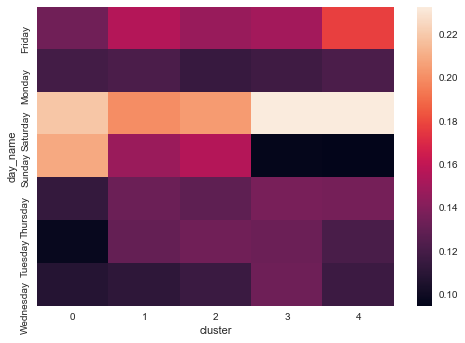

In [78]:
import seaborn as sns
sns.heatmap(pd.crosstab(df_group.day_name, df_group.cluster, normalize='columns'))

<AxesSubplot:xlabel='cluster', ylabel='hour'>

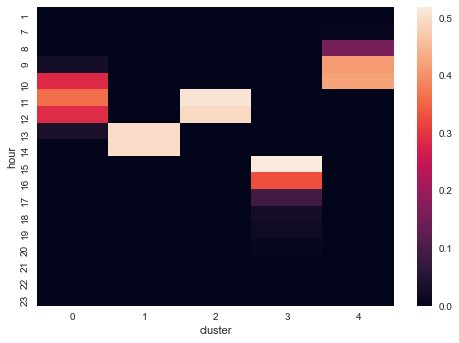

In [79]:
pd.crosstab(df_group.hour, df_group.cluster, normalize='columns'))

In [86]:
df_group.reset_index()[['Transaction','cluster']]

,Transaction,cluster
0,1,4
1,2,4
2,3,4
3,4,4
4,5,4
...,...,...
9526,9680,1
9527,9681,1
9528,9682,1
9529,9683,1


In [87]:
df_merged=pd.merge(df.iloc[:,:4], df_group.reset_index()[['Transaction','cluster']], on='Transaction', how='outer')

In [97]:
(df_merged.groupby('cluster').Item.apply(lambda x: x.value_counts(normalize=True).nlargest(5)).round(2)*100).astype(int)

cluster               
0        Coffee           38
         Tea               8
         Hot chocolate     5
         Bread             5
         Pastry            4
1        Coffee           22
         Bread            13
         Tea               8
         Sandwich          7
         Cake              6
2        Bread            23
         Coffee           21
         NONE              5
         Cake              4
         Pastry            4
3        Coffee           23
         Bread            14
         Tea               9
         Cake              8
         Hot chocolate     5
4        Coffee           26
         Bread            23
         Pastry            9
         Medialuna         6
         Tea               4
Name: Item, dtype: int32

<AxesSubplot:xlabel='cluster', ylabel='hour'>

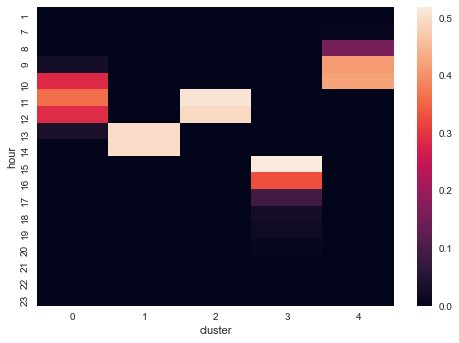

In [92]:
sns.heatmap(pd.crosstab(df_group.hour, df_group.cluster, normalize='columns'))

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

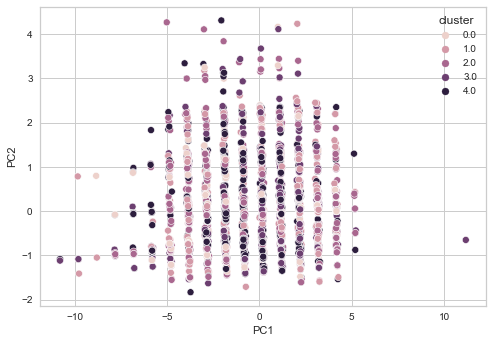

In [110]:
sns.scatterplot(x=df_pca.PC1, y=df_pca.PC2, hue=df_ml.cluster)

# Clusters without PCA

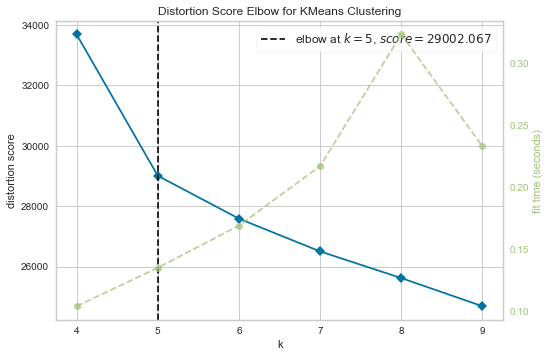

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [118]:
mod=KMeans()
visualizer=KElbowVisualizer(mod, k=(4,10))
visualizer.fit(df_ml)
visualizer.poof()


In [111]:
model=KMeans(5)
model.fit(df_ml)
model.predict(df_ml)

array([1, 1, 1, ..., 4, 4, 3])

<AxesSubplot:xlabel='col_0', ylabel='hour'>

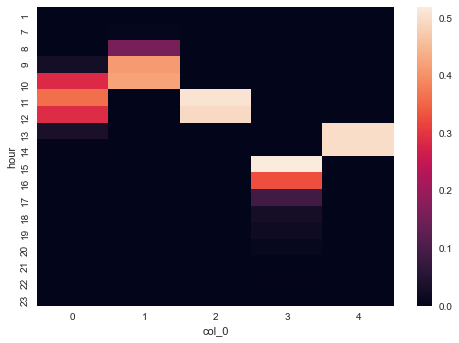

In [112]:
sns.heatmap(pd.crosstab(df_group.hour, model.labels_, normalize='columns'))

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

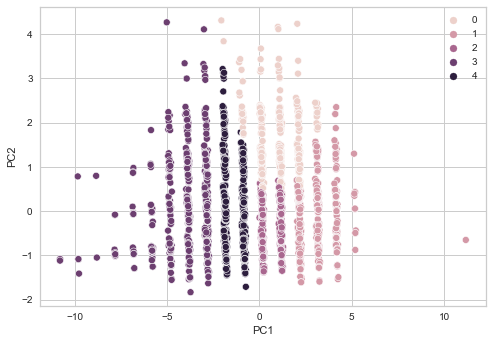

In [113]:
sns.scatterplot(x=df_pca.PC1, y=df_pca.PC2, hue=model.labels_)


# Evaluation Metrics

In [119]:
from sklearn import datasets

In [120]:
from sklearn.cluster import AgglomerativeClustering

In [121]:
X,y = datasets.make_blobs(random_state=42)

In [123]:
X.shape

(100, 2)

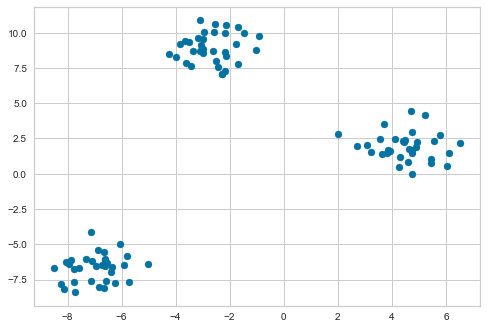

In [125]:
plt.scatter(X[:,0], X[:,1])

In [126]:
km=KMeans(3)
ac=AgglomerativeClustering(3)

In [127]:
km.fit(X)
ac.fit(X)


AgglomerativeClustering(n_clusters=3)

In [128]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [130]:
print('Silhouette Score for KMeans is', silhouette_score(X, km.labels_))
print('Silhouette Score for Agglomerative is', silhouette_score(X, ac.labels_))

Silhouette Score for KMeans is 0.8469881221532085
Silhouette Score for Agglomerative is 0.8469881221532085


In [131]:
print('Davies Bouldin Score for KMeans is', davies_bouldin_score(X, km.labels_))
print('Davies Bouldin Score for Agglomerative is', davies_bouldin_score(X, ac.labels_))

Davies Bouldin Score for KMeans is 0.21374667882527573
Davies Bouldin Score for Agglomerative is 0.21374667882527573


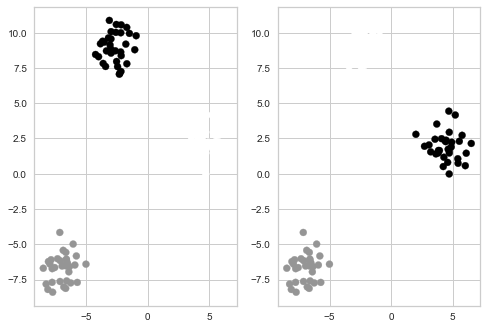

In [132]:
_, [ax1, ax2]=plt.subplots(1,2)

ax1.scatter(X[:,0],X[:,1], c=km.labels_)

ax2.scatter(X[:,0],X[:,1], c=ac.labels_)

In [151]:
X,y = datasets.make_moons(random_state=42, noise=0.1)


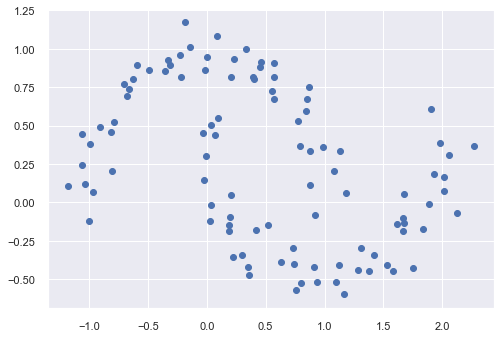

In [152]:
plt.scatter(X[:,0], X[:,1])


In [153]:
km=KMeans(2)
ac=AgglomerativeClustering(2, linkage='single')

km.fit(X)
ac.fit(X)

AgglomerativeClustering(linkage='single')

In [154]:
print('Silhouette Score for KMeans is', silhouette_score(X, km.labels_))
print('Silhouette Score for Agglomerative is', silhouette_score(X, ac.labels_))

Silhouette Score for KMeans is 0.4767042663096479
Silhouette Score for Agglomerative is 0.3075102992009324


In [155]:
print('Davies Bouldin Score for KMeans is', davies_bouldin_score(X, km.labels_))
print('Davies Bouldin Score for Agglomerative is', davies_bouldin_score(X, ac.labels_))

Davies Bouldin Score for KMeans is 0.7835429631981143
Davies Bouldin Score for Agglomerative is 1.1904671758172507


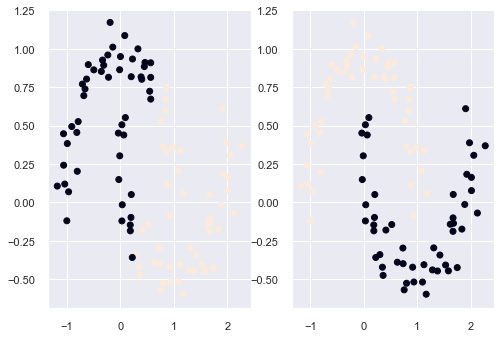

In [156]:
_, [ax1, ax2]=plt.subplots(1,2)

ax1.scatter(X[:,0],X[:,1], c=km.labels_)

ax2.scatter(X[:,0],X[:,1], c=ac.labels_)

In [147]:
sns.set()

<img src='https://i.pinimg.com/originals/7b/9c/7a/7b9c7a125be539afee12ad154e83449b.png' width='600px'>

<img src='https://www.pointels.com/wp-content/uploads/2020/11/0003.jpg' width='600px'>

<img src='https://live.staticflickr.com/65535/50223298171_255a0c2851_b.jpg' width='500px'>

<img src='https://images-na.ssl-images-amazon.com/images/I/51s4mlPWpCL._AC_.jpg'>

In [157]:
import requests as r

In [162]:
image_b=r.get('https://c8.alamy.com/compit/m9104t/milder-vorgang-evenement-doux-milder-vorgang-dolce-evento-1928-wassily-kandinsky-mosca-russia-impero-russo-1866-neuilly-sur-seine-1944-francia-francese-m9104t.jpg').content
with open('pic.jpg', 'wb') as file:
    file.write(image_b)

In [163]:
from PIL import Image

In [169]:
image_n=numpy.array(Image.open('pic.jpg'))

In [173]:
pixels=image_n.reshape((-1,3))

In [174]:
pixels[0]

array([126, 148, 161], dtype=uint8)

In [175]:
from sklearn.cluster import MiniBatchKMeans

In [176]:
mkm=MiniBatchKMeans(6)
mkm.fit(pixels)


MiniBatchKMeans(n_clusters=6)

In [180]:
values=mkm.cluster_centers_.round()
labels=mkm.labels_

In [183]:
img_compressed=values[labels].reshape(image_n.shape)

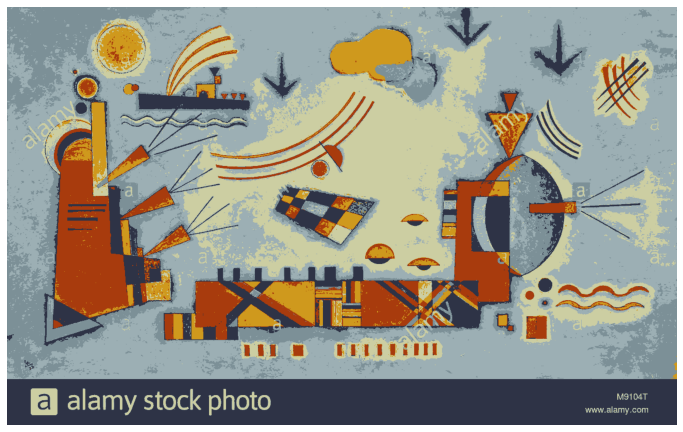

In [188]:
plt.figure(figsize=(12,18))
plt.axis('off')
plt.imshow(img_compressed.astype(np.uint8))


In [189]:
border=(img_compressed[1:,1:,0]==img_compressed[:-1,1:,0]) & (img_compressed[1:,1:,0]==img_compressed[1:,:-1,0])
border=np.vstack((
    np.hstack((
        [False], 
        img_compressed[0,1:,0]==img_compressed[0,:-1,0])).reshape((1,-1)),
    np.hstack((
        (img_compressed[1:,0,0]==img_compressed[:-1,0,0]).reshape((-1,1)),
            border))))

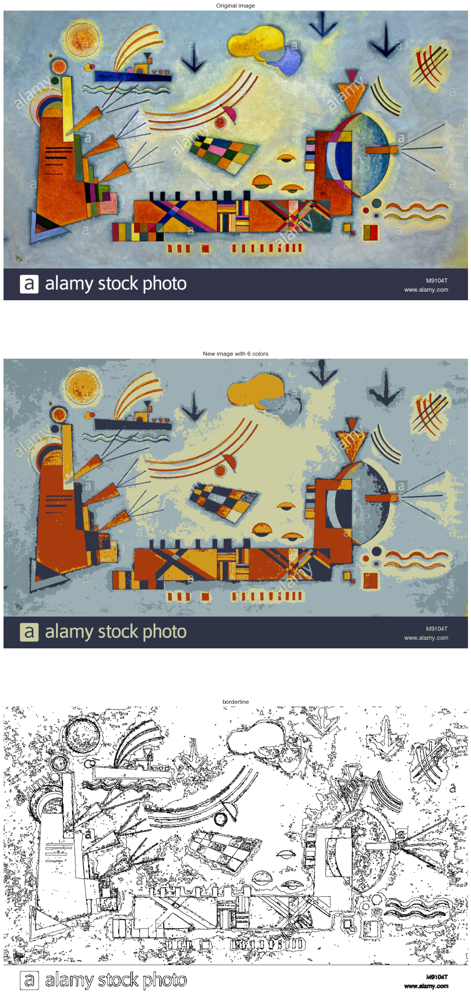

In [192]:
 _, [ax1,ax2,ax3]=plt.subplots(3,1,sharex=True, figsize=(80,36))

plt.axis('off')
ax3.imshow(border, cmap='gray')
ax3.set_title('borderline')
ax3.axis('off')
ax2.imshow(img_compressed.astype(np.uint8))
ax2.set_title(f'New image with {6} colors')
ax2.axis('off')
ax1.imshow(image_n.astype(np.uint8))
ax1.set_title('Original image')
ax1.axis('off')
plt.show()

# Text manipulations. Keyword detection

In [193]:
categories=['comp.graphics','talk.politics.guns','sci.space','rec.sport.hockey']

In [194]:
from sklearn.datasets import fetch_20newsgroups

In [195]:
datasets= fetch_20newsgroups(subset='all', categories=categories, shuffle=True, random_state=42)

In [197]:
len(datasets.data)

3869

In [202]:
print(datasets.data[11])

Subject: Re: univesa driver
From: djlewis@ualr.edu
Organization: University of Arkansas at Little Rock
Nntp-Posting-Host: athena.ualr.edu
Lines: 13

In article <13622@news.duke.edu>, seth@north13.acpub.duke.edu (Seth Wandersman) writes:
> 
> 	I got the univesa driver available over the net. I thought that finally
> my 1-meg oak board would be able to show 680x1024 256 colors. Unfortunately a
> program still says that I can't do this. Is it the fault of the program (fractint)
> or is there something wrong with my card.
> 	univesa- a free driver available over the net that makes many boards
> vesa compatible. 
WHATS THIS  680x1024 256 color mode? Asking a lot of your hardware ?

Don Lewis
<djlewis@ualr.edu>




In [203]:
datasets.target[11]

0

In [201]:
datasets.target_names

['comp.graphics', 'rec.sport.hockey', 'sci.space', 'talk.politics.guns']

In [204]:
from sklearn.feature_extraction.text import TfidfTransformer, TfidfVectorizer

In [205]:
vector=TfidfVectorizer(max_df=0.5, max_features=1000, stop_words='english')

In [206]:
X=vector.fit_transform(datasets.data)

In [209]:
X

<3869x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 178514 stored elements in Compressed Sparse Row format>

In [236]:
mkm=KMeans(4)
mkm.fit(X)

KMeans(n_clusters=4)

In [237]:
silhouette_score(X, mkm.labels_)

0.01929008779764411

In [238]:
davies_bouldin_score(X.toarray(), mkm.labels_)

7.035151870603809

In [239]:
terms=vector.get_feature_names()

In [240]:
for i in range(4):
    print(f'Cluster #{i}\n')
    for ind in mkm.cluster_centers_.argsort()[:, ::-1][i, :10]:
        print(terms[ind]+' ')
    print()

Cluster #0

space 
nasa 
henry 
access 
gov 
digex 
alaska 
pat 
shuttle 
toronto 

Cluster #1

com 
gun 
people 
fbi 
stratus 
guns 
government 
don 
atf 
batf 

Cluster #2

game 
ca 
hockey 
team 
nhl 
games 
play 
espn 
players 
university 

Cluster #3

graphics 
com 
university 
thanks 
posting 
image 
host 
nntp 
ac 
computer 



In [232]:
np.array(datasets.target_names)[datasets.target]

array(['talk.politics.guns', 'talk.politics.guns', 'sci.space', ...,
       'sci.space', 'comp.graphics', 'comp.graphics'], dtype='<U18')

In [241]:

df=pd.DataFrame(np.array(datasets.target_names)[datasets.target], columns=['actual'])

In [242]:
df['predicted']=mkm.labels_

<AxesSubplot:xlabel='predicted', ylabel='actual'>

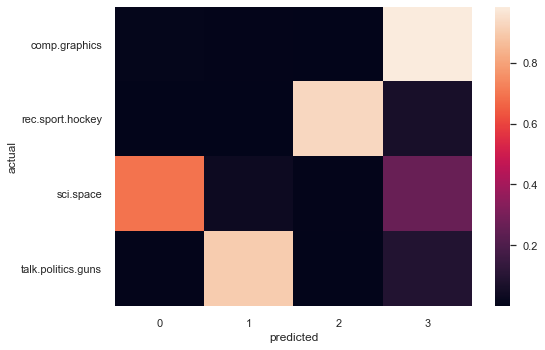

In [243]:
sns.heatmap(pd.crosstab(df.actual, df.predicted, normalize='index'))

In [246]:
pd.crosstab(df.actual, df.predicted, normalize='columns').round(2)

predicted,0,1,2,3
actual,,,,
comp.graphics,0.01,0.01,0.00,0.70
rec.sport.hockey,0.00,0.00,0.99,0.05
sci.space,0.98,0.04,0.01,0.19
talk.politics.guns,0.01,0.95,0.00,0.06
